In [2]:
import os
import re
import time
import string

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torch
from sentence_transformers import SentenceTransformer, util
from sklearn.feature_extraction.text import CountVectorizer

import umap.umap_ as umap

import hdbscan
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering, SpectralCoclustering
from sklearn.metrics.pairwise import cosine_distances


from scipy.cluster.hierarchy import fcluster
from scipy.cluster.hierarchy import linkage, dendrogram

from sklearn.metrics import calinski_harabasz_score, silhouette_score, davies_bouldin_score

os.environ['XDG_CACHE_HOME'] = 'home/msds2022/casoriano/ .cache'

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-0hc481yz because the default path (/home/casoriano/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [3]:
filipino_abstracts = [112, 167, 638, 648, 663, 787, 1138, 1204]
df = pd.read_excel('research_profile_updated.xlsx').drop(filipino_abstracts)
df = df[df['Topic'].notnull()]
docs = df['Abstract'].copy().dropna()

length = docs.str.split(' ').apply(lambda x: np.log(len(x)))
docs = docs[abs((length - length.mean())/length.std()) > -3]
docs = docs.apply(lambda x: re.sub(r'[^a-zA-Z0-9- ]', '', x)).str.lower()

docs

0       the ched phernet-admu program has been conduct...
1       the warm tropical climate of the philippines a...
2       the study was conducted to determine the green...
3       this study aimed to establish a solid waste ma...
4       farming systems refers to the utilization of t...
                              ...                        
1258    sustainable and profitable management of falca...
1260    recently diverse innovative processes in food ...
1261    ensuring proper health and nutrition of the pe...
1262    this project aims to facilitate the delivery o...
1263    the president of the philippines was granted p...
Name: Abstract, Length: 716, dtype: object

## SPECTER

In [4]:
model = SentenceTransformer('allenai/specter')
model.max_seq_length = 512

In [5]:
start = time.time()
embeddings = model.encode(docs.tolist(), convert_to_tensor=True)
print("Embeddings:", time.time()-start)
embeddings = pd.DataFrame(embeddings.cpu().numpy())
embeddings

Embeddings: 15.260809898376465


,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.367278,0.446500,0.319726,-0.698154,-0.476773,-0.158669,0.073073,0.268992,0.352473,1.087897,...,0.481664,0.107410,0.987301,0.914397,-0.070303,-0.735920,-0.051531,0.494734,0.646963,0.570346
1,-0.108545,0.612939,0.535368,0.213604,-0.435395,-0.058225,-0.800363,-0.199306,-0.348939,0.962904,...,0.102022,0.129303,1.033372,0.853780,-0.167301,-0.255200,-0.078423,0.402345,0.437901,0.298196
2,-0.997458,0.409005,0.277808,-0.478699,-0.532011,-0.521333,0.056212,0.015039,-0.094822,0.660898,...,0.051799,-0.030300,1.008335,0.727391,-0.524004,-0.384851,-0.019957,0.748829,0.636491,0.336037
3,-0.694803,0.594741,0.447962,-0.234862,-0.869753,-0.118493,-0.410902,0.525824,-0.032186,0.721736,...,0.158341,0.616047,0.780993,0.547096,-0.478923,-0.328133,-0.000795,0.666931,0.693948,-0.108173
4,-0.391576,0.501825,-0.570256,-0.291601,-1.244321,0.483091,-1.043804,0.007342,-0.057918,0.771143,...,0.374886,0.085463,0.565957,1.276083,-0.558830,-0.327890,0.278374,0.046977,0.196731,-0.150847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
711,-0.420018,0.370974,-0.387536,-0.528355,-1.042832,0.039290,-1.220826,-0.368853,0.217233,1.266508,...,0.686647,0.260706,0.370555,1.263869,-0.510141,-0.506912,0.325203,-0.019186,0.100607,-0.408220
712,-0.662184,0.715052,0.405479,-0.351547,-1.267767,-0.050714,0.018628,0.217659,0.212043,0.881130,...,0.722220,-0.059985,0.686017,1.004132,0.004198,0.155933,0.335847,0.614836,0.318907,-0.101132
713,-0.792260,0.289158,0.525411,-0.082245,-1.051845,0.108599,-0.893857,0.590328,0.182516,0.861393,...,1.061466,0.434379,0.549747,0.941730,-0.249641,-0.932843,-0.297525,0.348355,0.502012,-0.426852
714,-0.581676,0.217078,0.027812,-0.576196,-0.823438,0.043948,-0.611694,-0.462973,0.161373,0.620844,...,0.776629,-0.140010,0.562174,1.047250,-0.310835,-0.397593,-0.049942,-0.332041,0.489083,0.204366


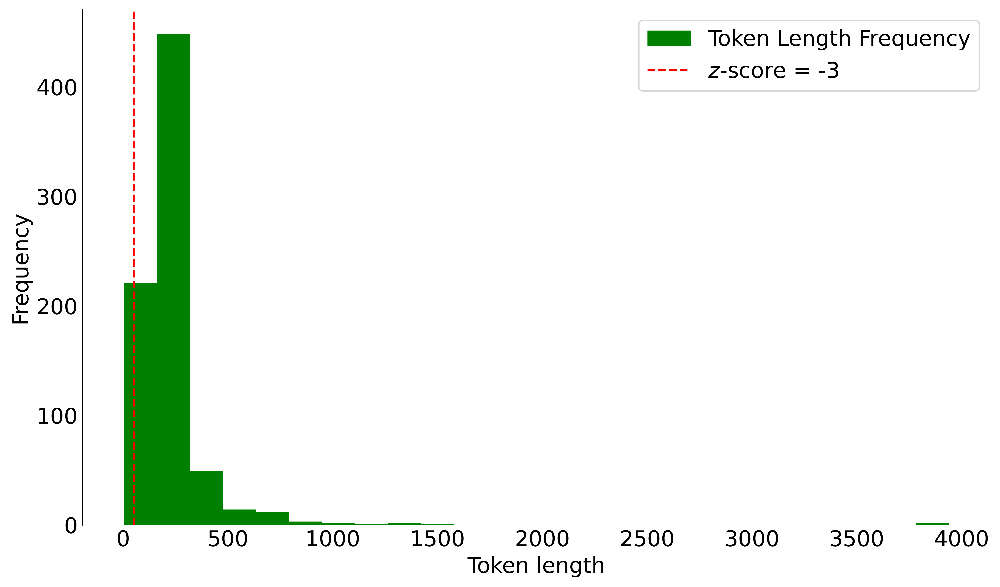

In [19]:
length = (pd.read_excel('research_profile_updated.xlsx')['Abstract'].dropna()
          .str.split(' ').apply(lambda x: len(x)))
plt.figure(figsize=(12,7), dpi=600)
length.hist(bins=25, color='g', label='Token Length Frequency')
plt.axvline(50, color='red', linestyle='--', label='$z$-score = -3')
plt.grid(visible=False)
# np.exp(length.mean() - (3*length.std()))
plt.xlabel('Token length', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.legend(fontsize=16)
plt.tick_params(axis='both', which='both', length=0, labelsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
# plt.legend(ncol=3, bbox_to_anchor=(1, -0.1))
plt.show()

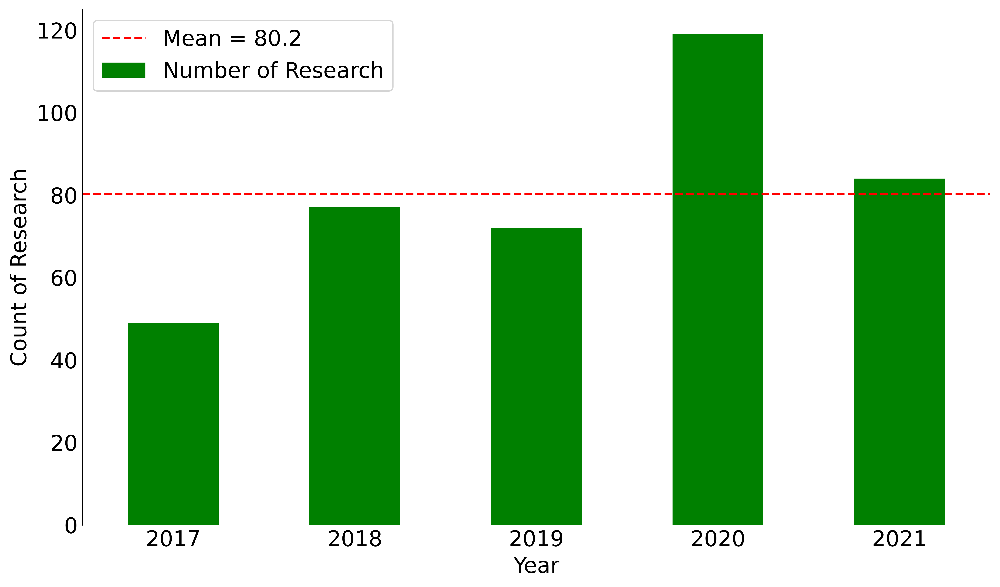

In [9]:
plt.figure(figsize=(12,7), dpi=600)
temp = df['Year Published'].dropna().astype(int)
temp = temp[(temp >= 2017) & (temp < 2022)]
temp.value_counts().sort_index().plot(kind='bar', color='green', label='Number of Research')
avg = np.mean(temp.value_counts())
plt.axhline(avg, color='red', linestyle='--', label=f'Mean = {avg}')
plt.ylabel('Count of Research', fontsize=16)
plt.xticks(rotation=0)
plt.tick_params(axis='both', which='both', length=0, labelsize=16)
plt.xlabel('Year', fontsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
plt.legend(fontsize=16)
plt.show()

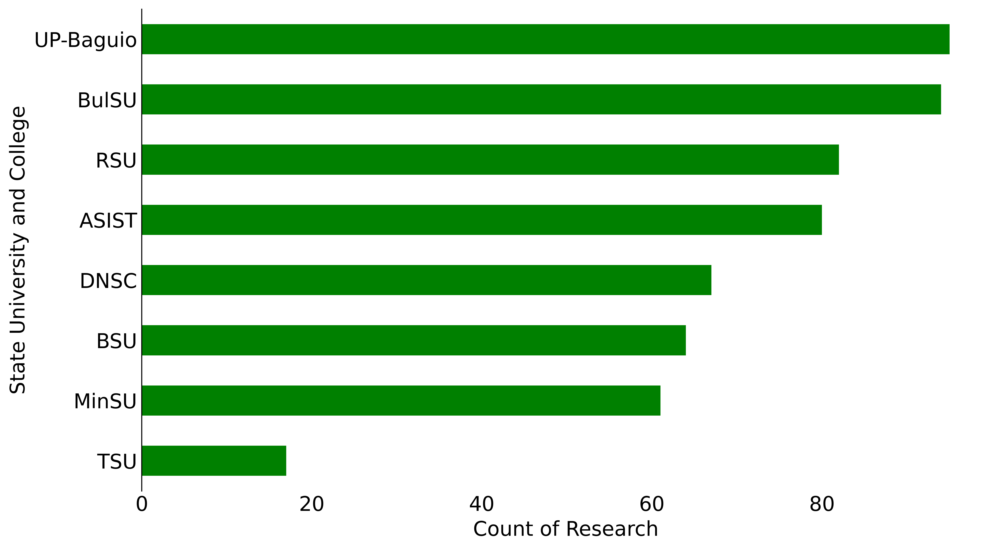

In [10]:
plt.figure(figsize=(12,7), dpi=600)
temp = df[df['Year (YYYY)'] >= 2017]['University (Abbreviation)'].value_counts()
temp[temp > 10][::-1].plot(kind='barh', color='green')
plt.xlabel('Count of Research', fontsize=16)
plt.ylabel('State University and College', fontsize=16)
plt.tick_params(axis='both', which='both', length=0, labelsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
plt.show()

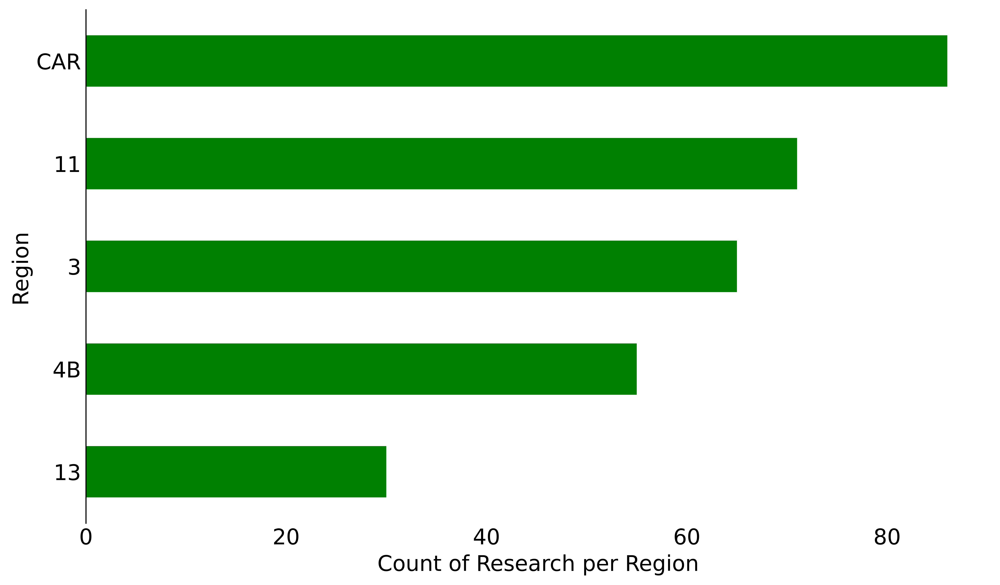

In [11]:
plt.figure(figsize=(12,7), dpi=600)
temp = df['Region'].value_counts()[4::-1]
temp = temp / np.array([1, 1, 2, 3, 3])
temp.sort_values().plot(kind='barh', color='green')
plt.xlabel('Count of Research per Region', fontsize=16)
plt.ylabel('Region', fontsize=16)
plt.tick_params(axis='both', which='both', length=0, labelsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
plt.show()

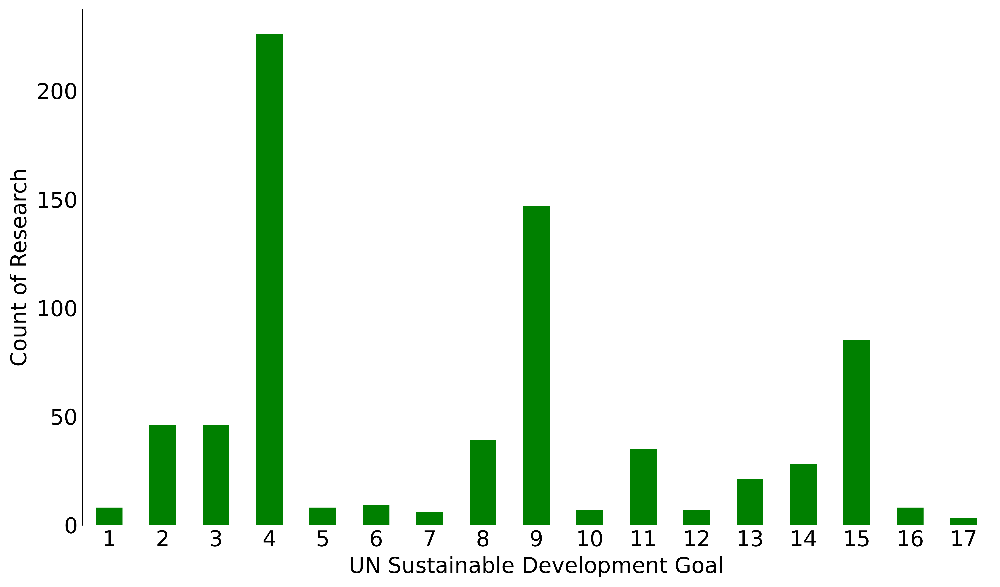

In [58]:
plt.figure(figsize=(12,7), dpi=600)
temp = df['SDG'].apply(lambda x: x.split('; ') if isinstance(x, str) else x).explode().astype(int).value_counts()
temp.sort_index().plot(kind='bar', color='green')
plt.ylabel('Count of Research', fontsize=16)
plt.xticks(rotation=0)
plt.tick_params(axis='both', which='both', length=0, labelsize=16)
plt.xlabel('UN Sustainable Development Goal', fontsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
plt.show()

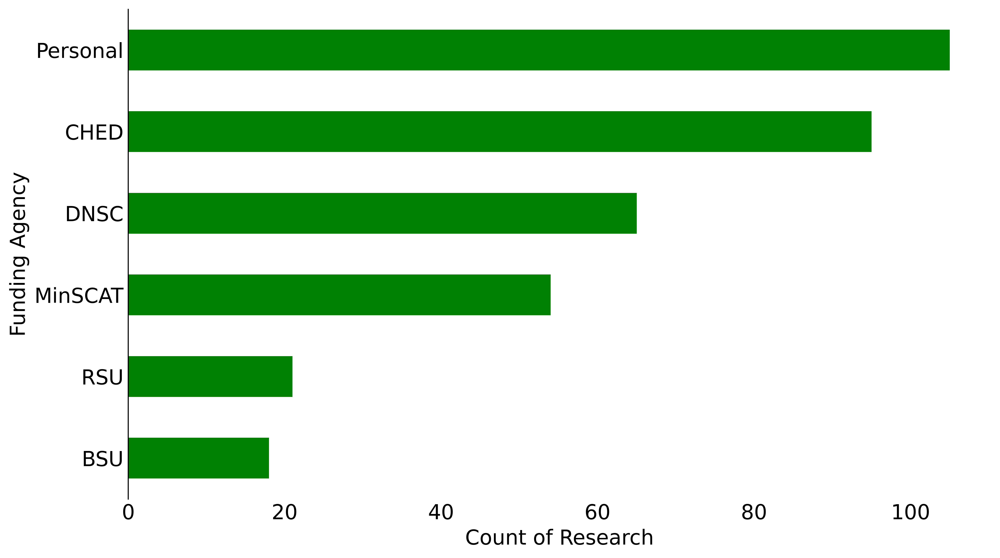

In [12]:
plt.figure(figsize=(12,7), dpi=600)
temp = df['Funding Agency'].dropna().value_counts()[:6]
temp.sort_values().plot(kind='barh', color='green', label='Number of Research')
plt.xlabel('Count of Research', fontsize=16)
plt.xticks(rotation=0)
plt.tick_params(axis='both', which='both', length=0, labelsize=16)
plt.ylabel('Funding Agency', fontsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
plt.show()

In [14]:
temp = umap.UMAP(n_neighbors=20, n_components=2, metric='cosine').fit_transform(embeddings)
temp = pd.DataFrame(temp, columns=['x', 'y'])

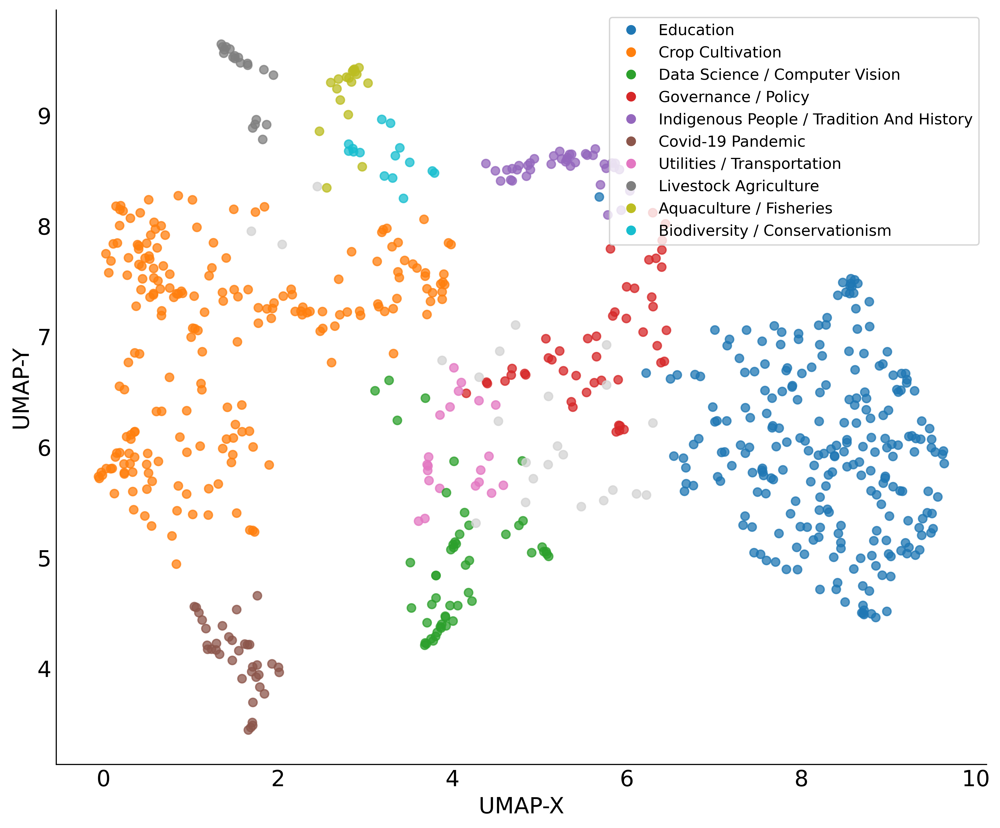

In [15]:
from matplotlib.cm import tab10

colors = {k: v for k, v in zip(
    df['Topic Name'].str.title().value_counts().drop('Outliers').index.tolist(),
    [tab10(float(i)/10) for i in range(10)])}
plt.figure(figsize=(12,10), dpi=600)
scatter = plt.scatter(temp.x, temp.y, alpha=0.75,
                      color=df['Topic Name'].str.title().dropna().map(colors).fillna('lightgrey'))
plt.xlabel('UMAP-X', fontsize=16)
plt.ylabel('UMAP-Y', fontsize=16)
handlelist = [plt.plot([], marker="o", ls="", color=color)[0] for color in colors.values()]
plt.legend(handlelist,[i.title() for i in colors.keys()], loc='upper right', fontsize=11)
plt.tick_params(axis='both', which='both', length=0, labelsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.show()

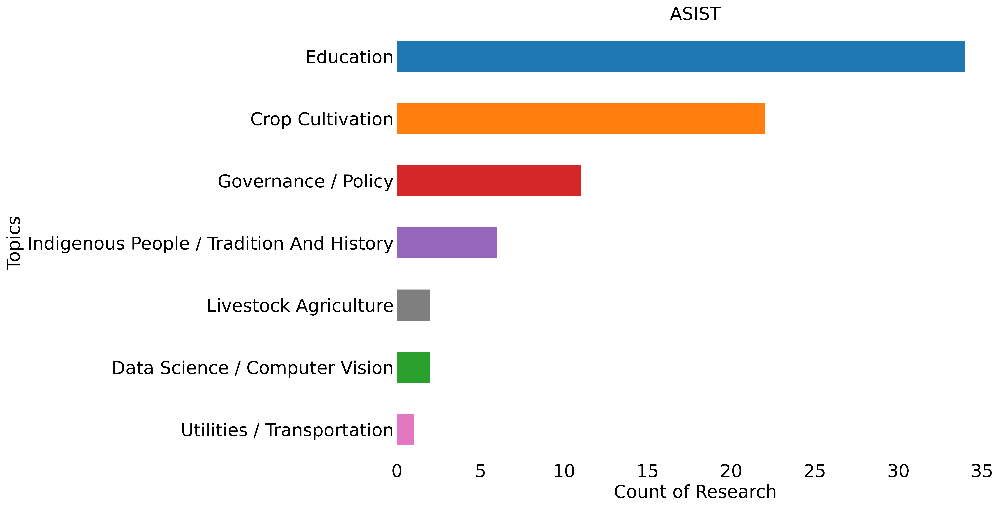

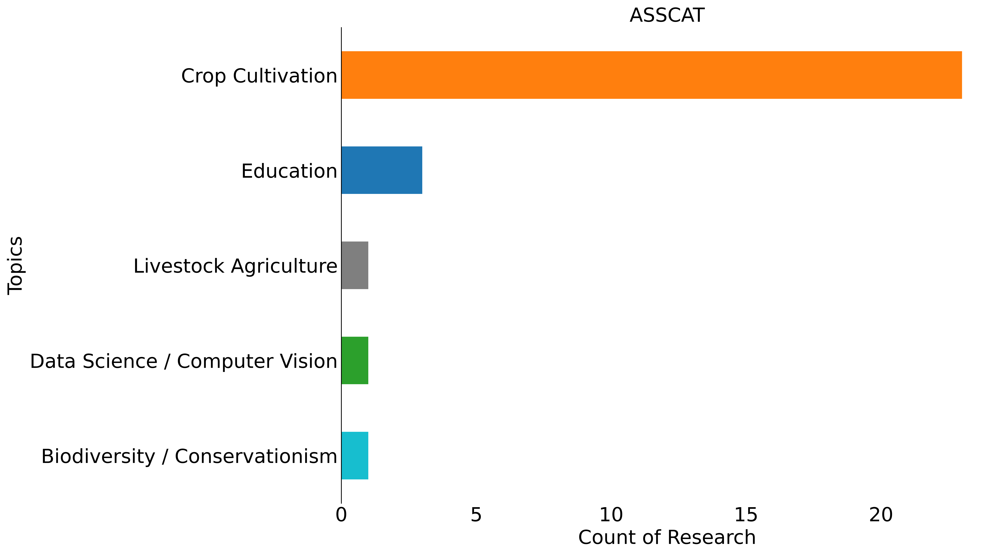

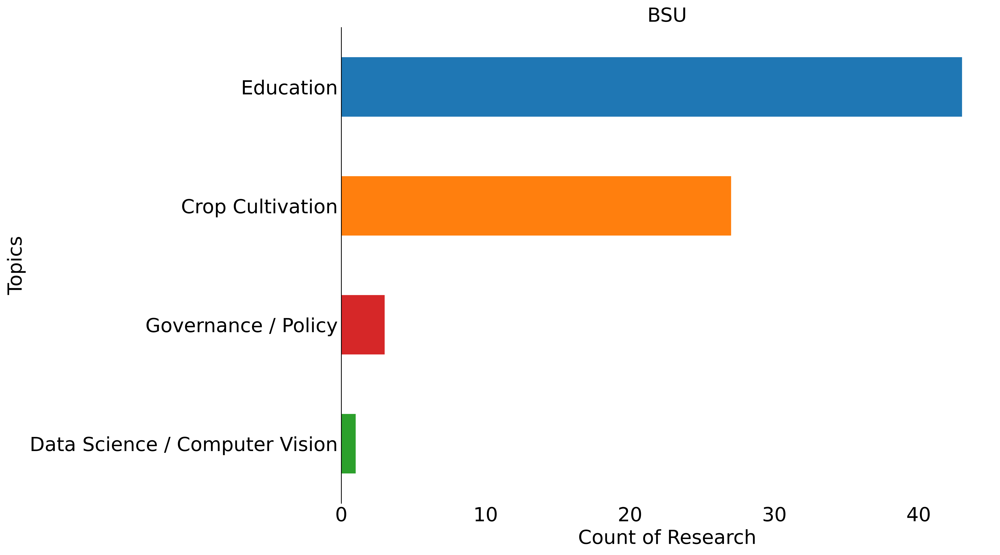

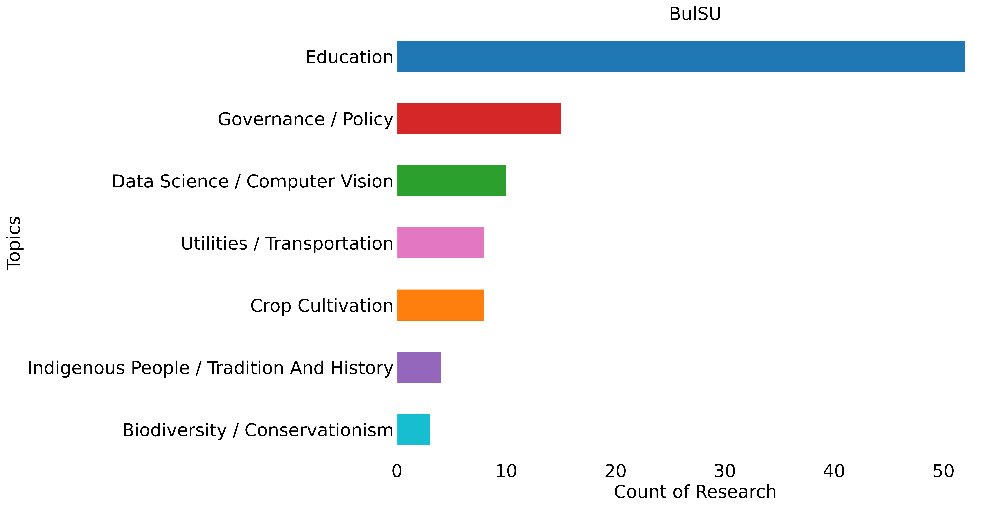

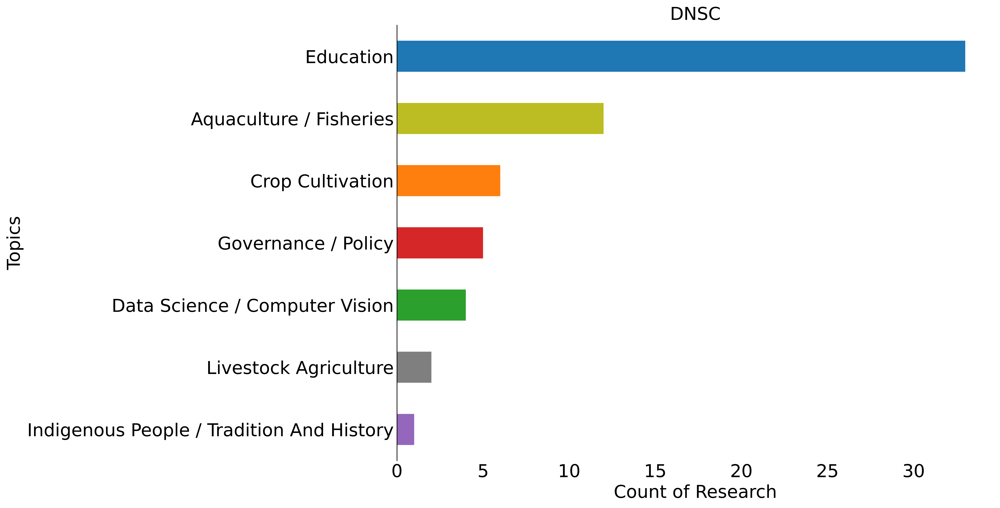

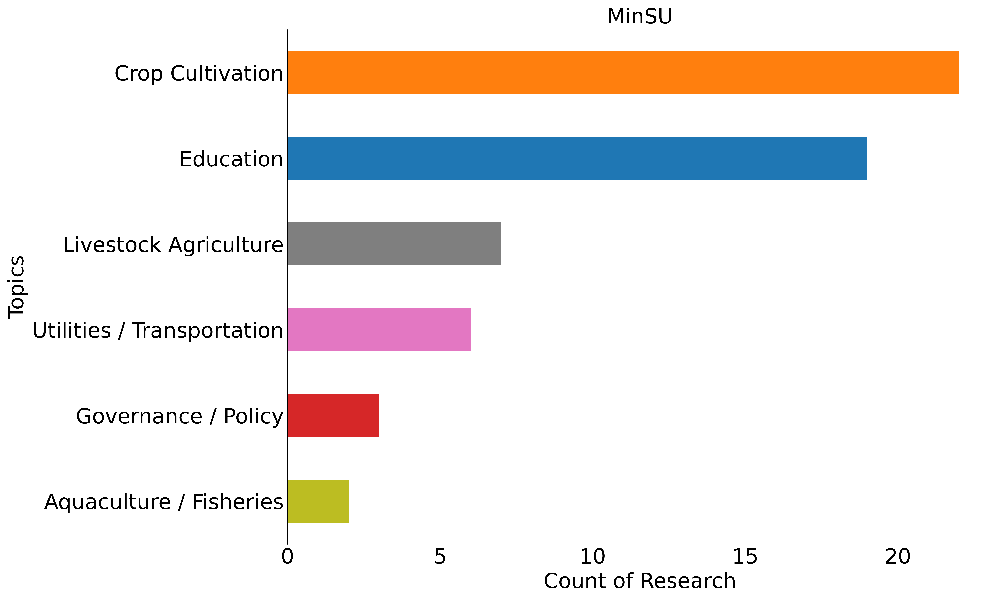

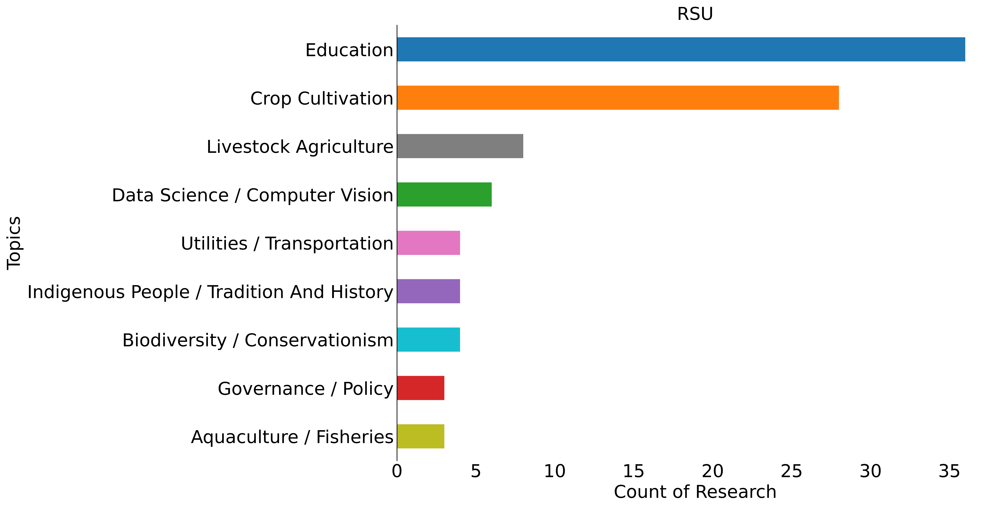

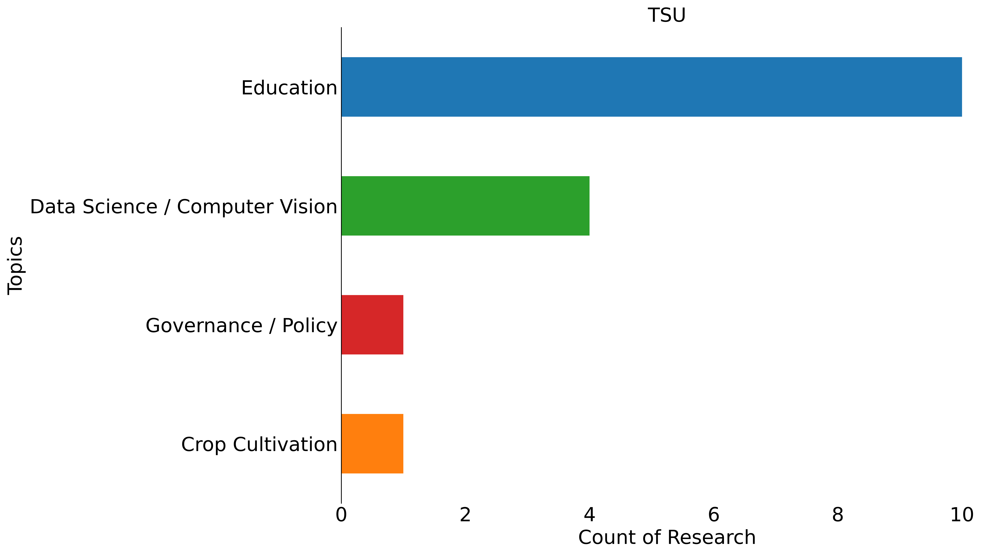

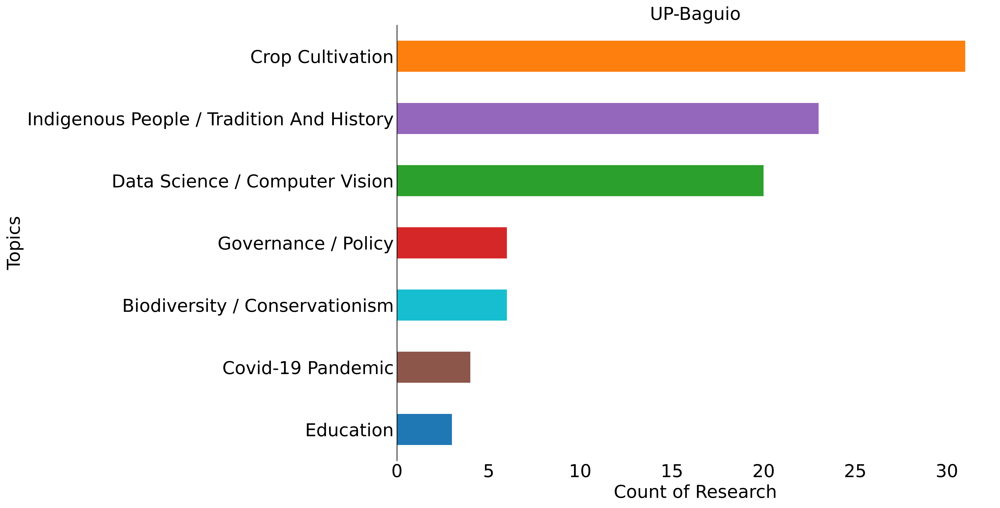

In [22]:
temp_ = (df[df['Topic Name'] != 'Outliers']
        [['University (Abbreviation)', 'Topic Name']]
        .groupby(['University (Abbreviation)', 'Topic Name']).size()
        .reset_index(level=[1]))
temp_['Topic Name'] = temp_['Topic Name'].str.title()
for i in temp_.index.unique():
    if temp_.loc[i, 0].sum() > 5:
        fig, ax = plt.subplots(figsize=(12, 9), dpi=600)
        temp_.loc[i].sort_values(0).plot(kind='barh', x='Topic Name', y=0, legend=None,
            color=[colors[j] for j in temp_.loc[i].sort_values(0)['Topic Name']], ax=ax)
        plt.title(i, fontsize=20)
        # plt.xlim([0, 50])
        plt.xlabel('Count of Research', fontsize=20)
        plt.ylabel('Topics', fontsize=20)
        plt.tick_params(axis='both', which='both', length=0, labelsize=20)
        plt.gca().spines.right.set_visible(False)
        plt.gca().spines.top.set_visible(False)
        plt.gca().spines.bottom.set_visible(False)
        plt.show()

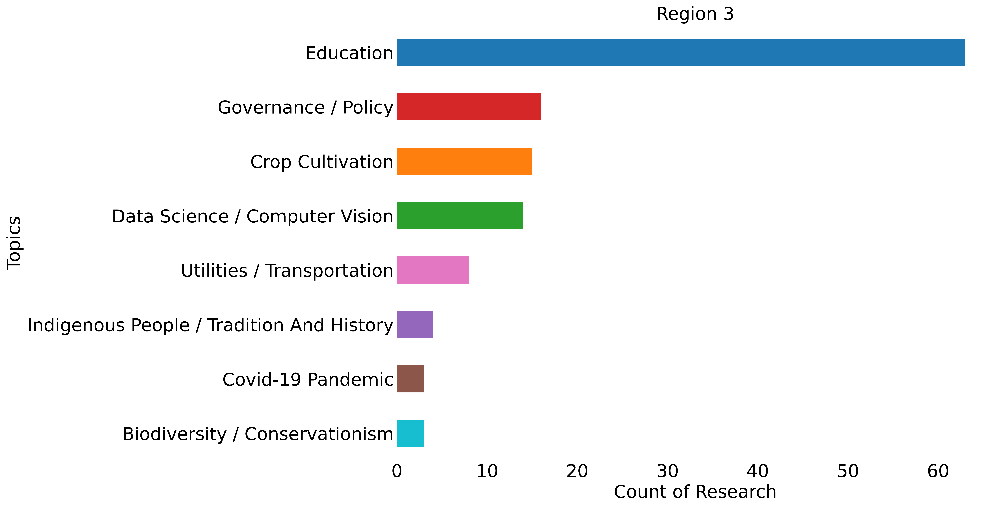

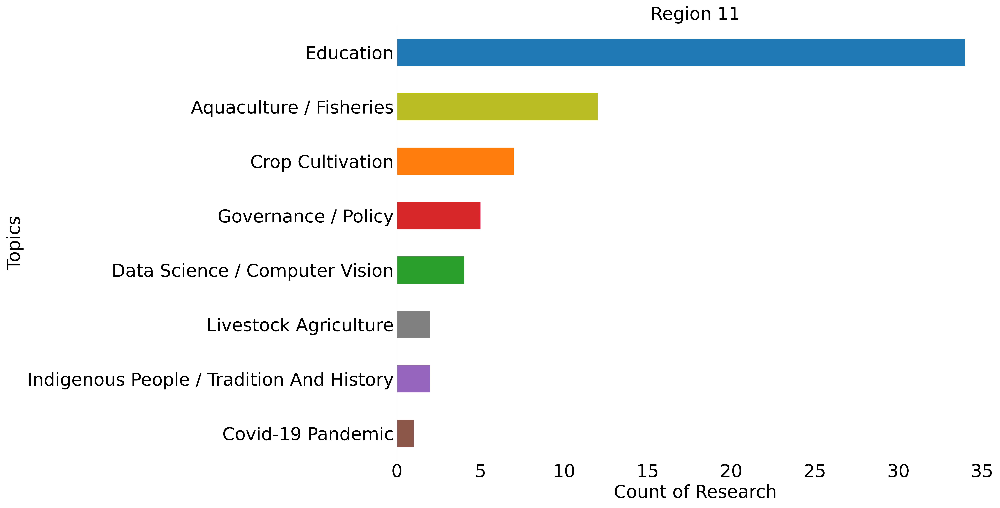

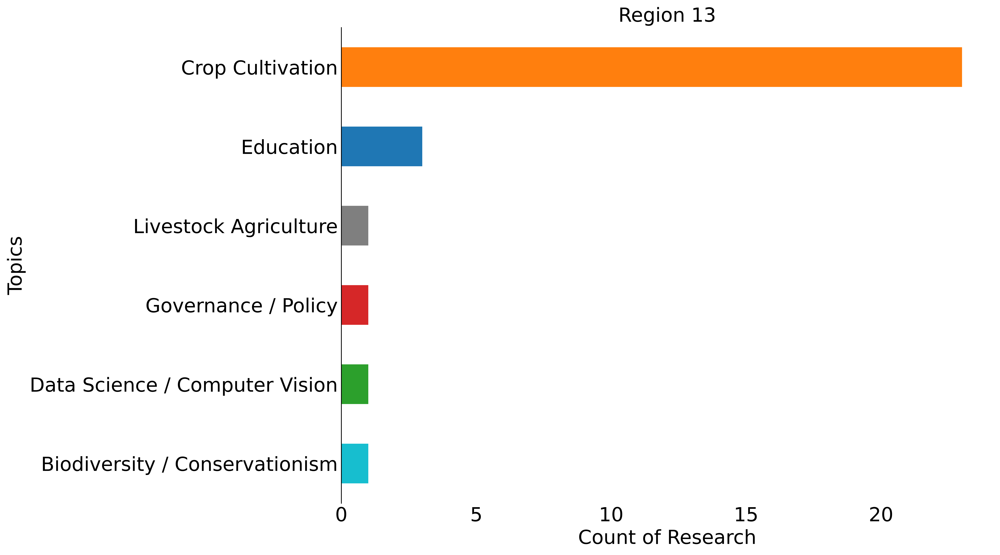

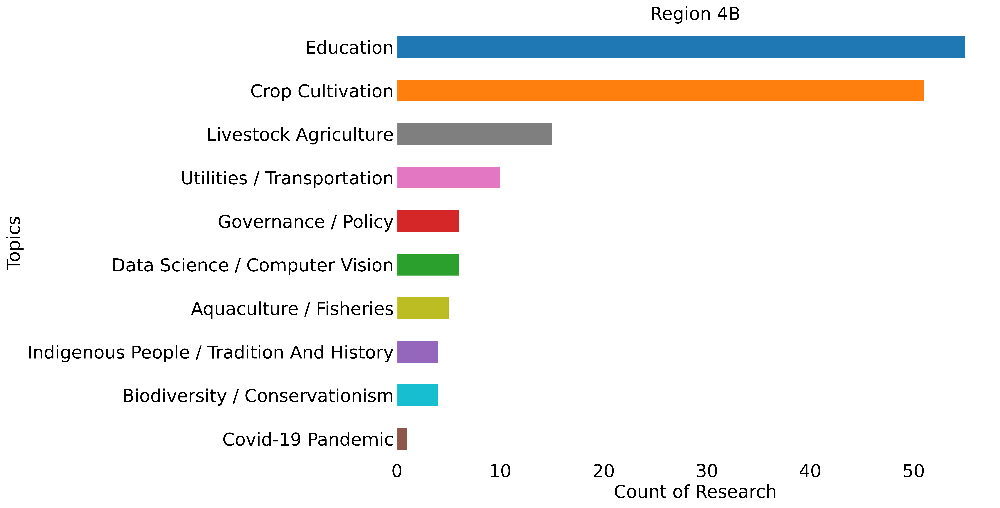

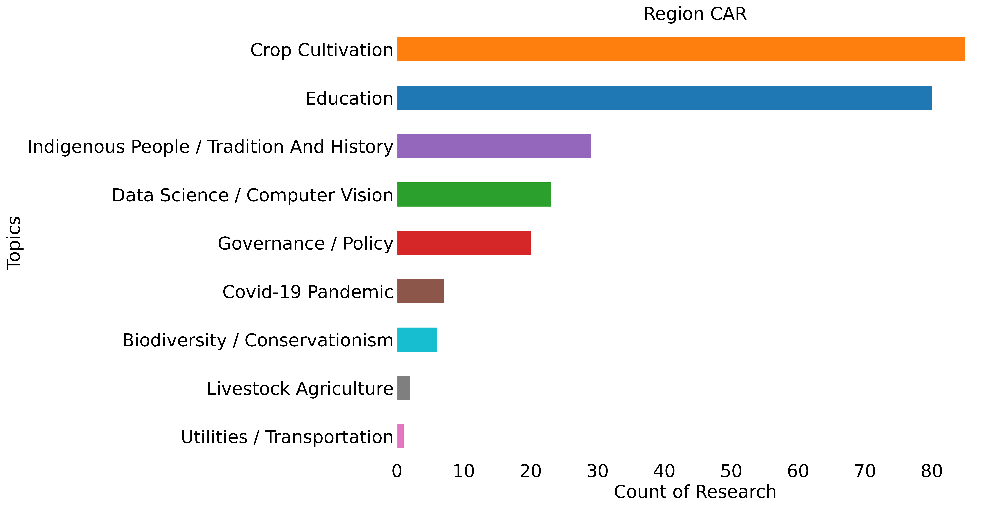

In [26]:
temp_ = (df[df['Topic Name'] != 'Outliers']
        [['Region', 'Topic Name']]
        .groupby(['Region', 'Topic Name']).size()
        .reset_index(level=[1]))
temp_['Topic Name'] = temp_['Topic Name'].str.title()
for i in temp_.index.unique():
    if i in [3, 11, '4B', 13, 'CAR']:
        fig, ax = plt.subplots(figsize=(12,9), dpi=600)
        temp_.loc[i].sort_values(0).plot(kind='barh', x='Topic Name', y=0, legend=None,
            color=[colors[j] for j in temp_.loc[i].sort_values(0)['Topic Name']], ax=ax)
        plt.title('Region ' + str(i), fontsize=20)
        plt.xlabel('Count of Research', fontsize=20)
        plt.ylabel('Topics', fontsize=20)
        plt.tick_params(axis='both', which='both', length=0, labelsize=20)
        plt.gca().spines.right.set_visible(False)
        plt.gca().spines.top.set_visible(False)
        plt.gca().spines.bottom.set_visible(False)
        plt.show()

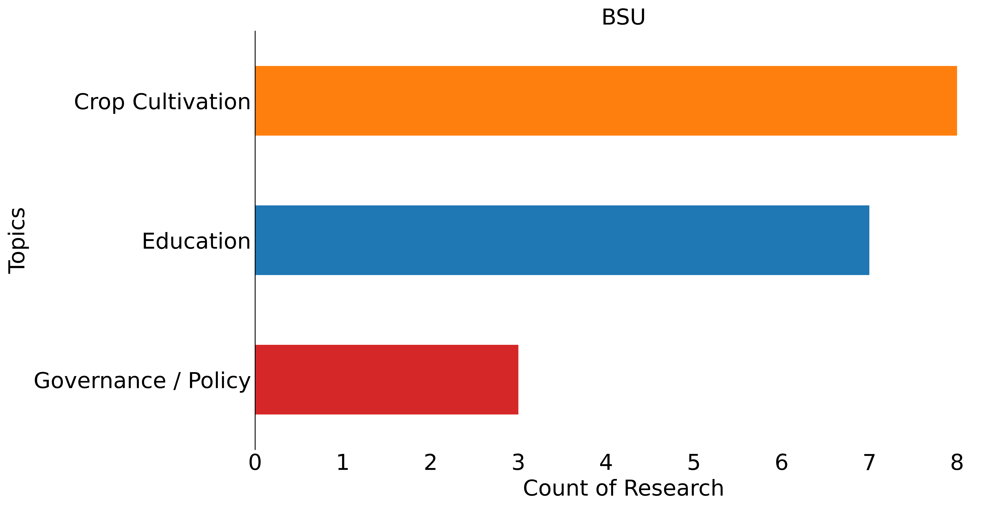

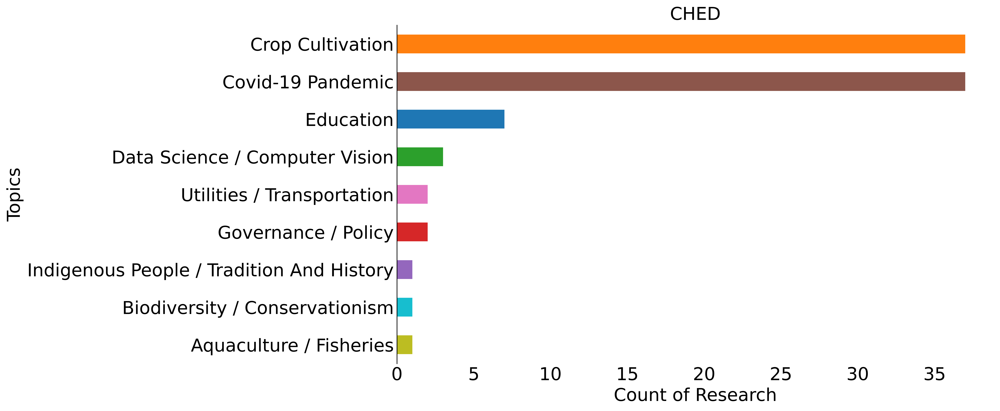

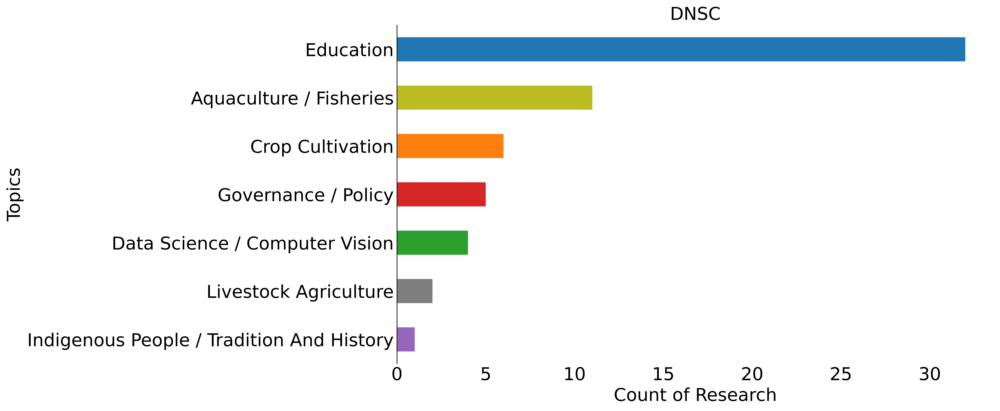

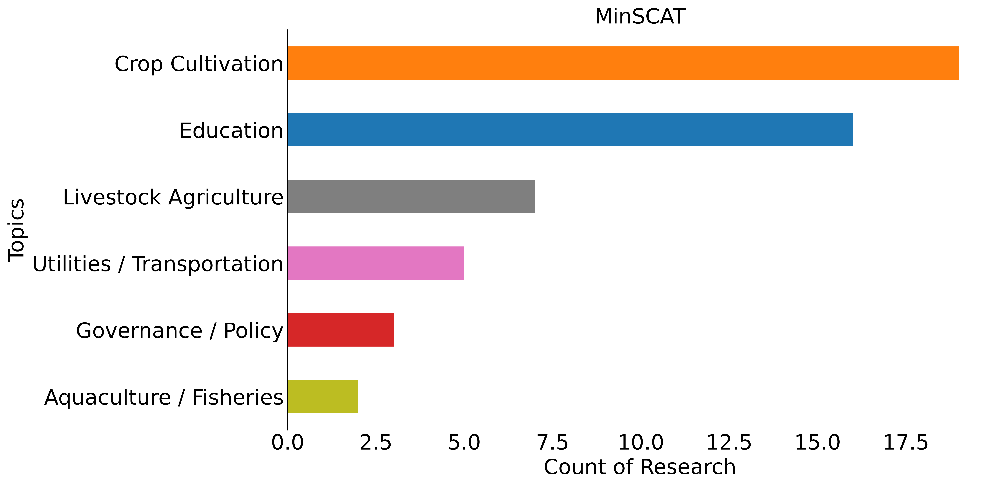

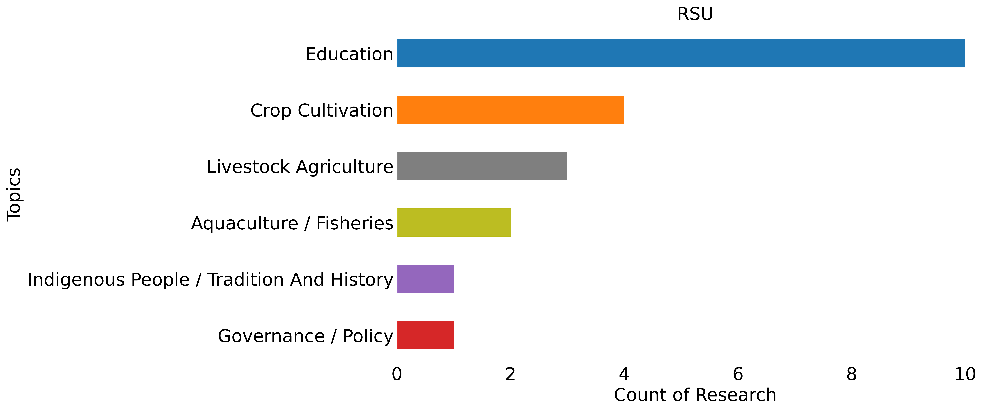

In [27]:
temp_ = (df[(df['Topic Name'] != 'Outliers') & (df['Funding Agency'] != 'Personal')]
        [['Funding Agency', 'Topic Name']]
        .groupby(['Funding Agency', 'Topic Name']).size()
        .reset_index(level=[1]))
temp_['Topic Name'] = temp_['Topic Name'].str.title()
temp_[0] = temp_[0].astype(int)
for i in temp_.index.unique():
    if i in ['CHED', 'DNSC', 'MinSCAT', 'RSU', 'BSU']:
            fig, ax = plt.subplots(figsize=(12, 7), dpi=600)
            temp_.loc[i].sort_values(0).plot(kind='barh', x='Topic Name', y=0, legend=None,
                color=[colors[j] for j in temp_.loc[i].sort_values(0)['Topic Name']], ax=ax)
            plt.title(i, fontsize=20)
            plt.xlabel('Count of Research', fontsize=20)
            plt.ylabel('Topics', fontsize=20)
            plt.tick_params(axis='both', which='both', length=0, labelsize=20)
            plt.gca().spines.right.set_visible(False)
            plt.gca().spines.top.set_visible(False)
            plt.gca().spines.bottom.set_visible(False)
            plt.show()

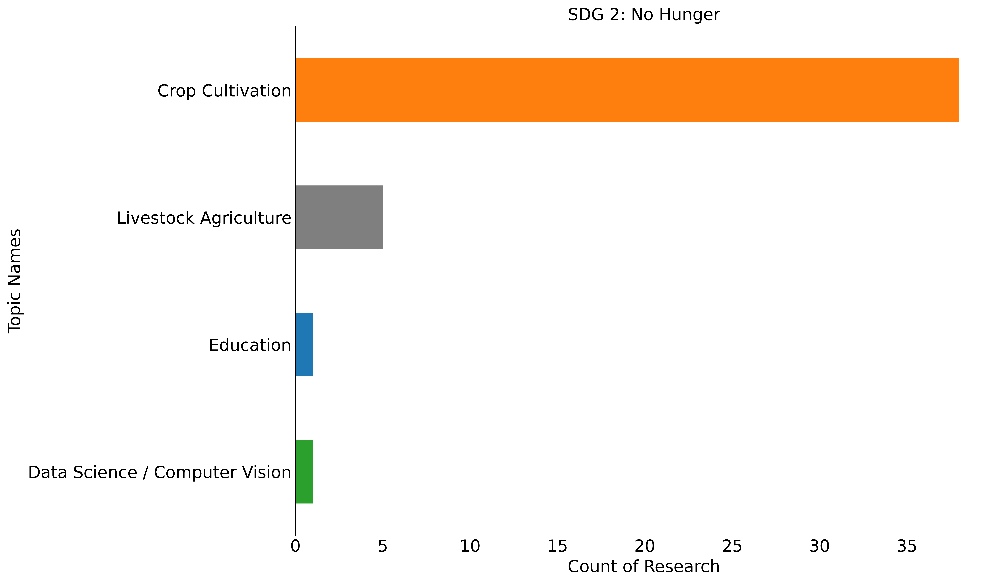

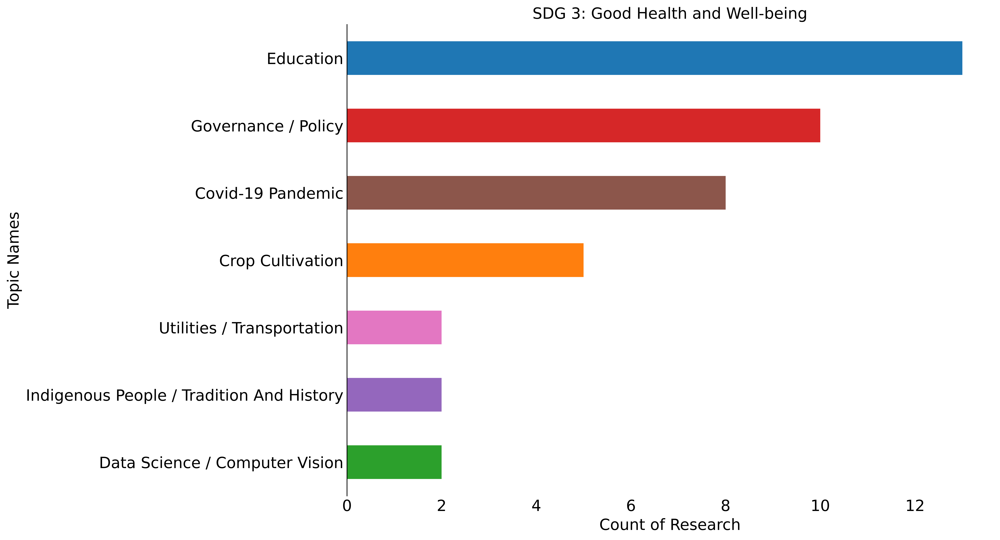

In [ ]:
sdgs = {1: 'No Poverty',
2: 'No Hunger',
3: 'Good Health and Well-being',
4: 'Quality Education',
5: 'Gender Equality',
6: 'Clean Water and Sanitation',
7: 'Affordable and Clean Energy',
8: 'Decent Work and Economic Growth',
9: 'Industry, Innovation and Infrastructure',
10: 'Reduced Inequality',
11: 'Sustainable Cities and Communities',
12: 'Responsible Consumption and Production',
13: 'Climate Action',
14: 'Life Below Water',
15: 'Life on Land',
16: 'Peace, Justice, and Strong Institutions',
17: 'Partnerships for the Goals',}

temp_ = (df[df['Topic Name'] != 'Outliers']
        [['SDG', 'Topic Name']]
        .groupby(['SDG', 'Topic Name']).size()
        .reset_index(level=[1]))
temp_['Topic Name'] = temp_['Topic Name'].str.title()
for i in temp_.index.unique():
    if temp_.loc[i, 0].sum() > 20:
        fig, ax = plt.subplots(figsize=(12, 9), dpi=600)
        temp_.loc[i].sort_values(0).plot(kind='barh', x='Topic Name', y=0, legend=None,
            color=[colors[j] for j in temp_.loc[i].sort_values(0)['Topic Name']], ax=ax)
        plt.title('SDG ' + str(i) + ': ' + sdgs[i], fontsize=16)
        plt.xlabel('Count of Research', fontsize=16)
        plt.ylabel('Topic Names', fontsize=16)
        plt.tick_params(axis='both', which='both', length=0, labelsize=16)
        plt.gca().spines.right.set_visible(False)
        plt.gca().spines.top.set_visible(False)
        plt.gca().spines.bottom.set_visible(False)
        plt.show()

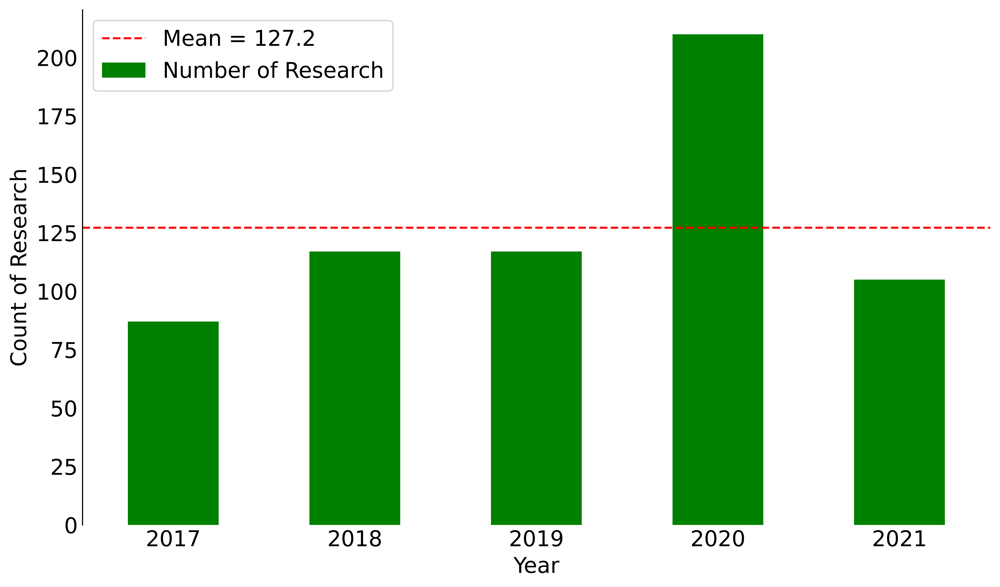

In [31]:
plt.figure(figsize=(12,7), dpi=600)
temp = df['Year (YYYY)'].dropna().astype(int)
temp = temp[(temp >= 2017) & (temp < 2022)]
temp.value_counts().sort_index().plot(kind='bar', color='green', label='Number of Research')
avg = np.mean(temp.value_counts())
plt.axhline(avg, color='red', linestyle='--', label=f'Mean = {avg}')
plt.ylabel('Count of Research', fontsize=16)
plt.xticks(rotation=0)
plt.tick_params(axis='both', which='both', length=0, labelsize=16)
plt.xlabel('Year', fontsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
plt.legend(fontsize=16)
plt.show()

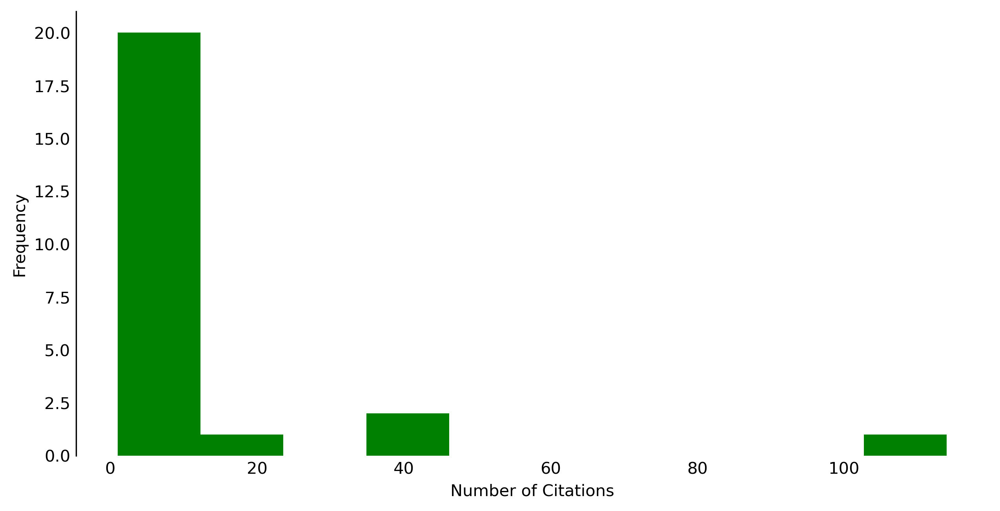

In [7]:
plt.figure(figsize=(12,7), dpi=600)
temp = df['Number of Citations as of Jan 2022'].dropna().astype(int)
temp.value_counts().sort_index().plot(kind='hist', color='green')
plt.ylabel('Frequency', fontsize=16)
plt.xticks(rotation=0)
plt.tick_params(axis='both', which='both', length=0, lavesize=16)
plt.xlabel('Number of Citations', fontsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
plt.show()

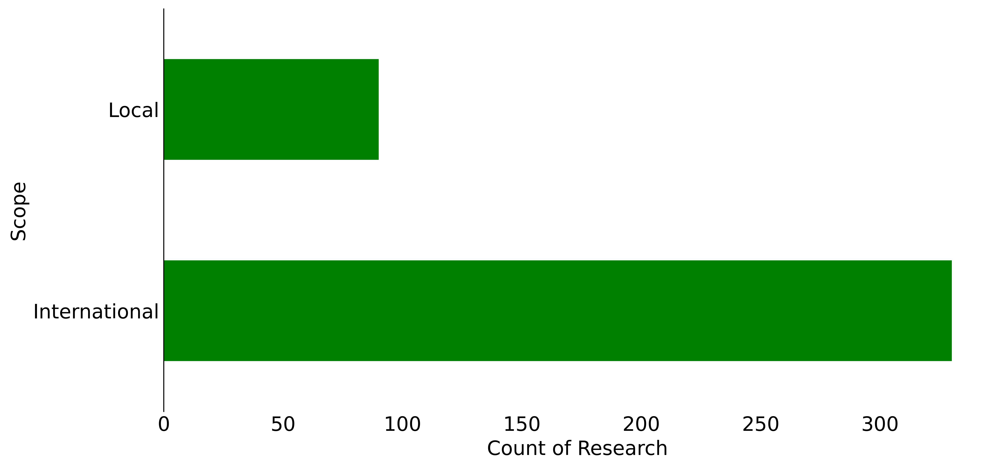

In [33]:
plt.figure(figsize=(12,6), dpi=600)
temp = df['Local/International'].dropna()
temp.value_counts().sort_index().plot(kind='barh', color='green')
plt.ylabel('Scope', fontsize=16)
plt.xticks(rotation=0)
plt.tick_params(axis='both', which='both', length=0, labelsize=16)
plt.xlabel('Count of Research', fontsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
plt.show()

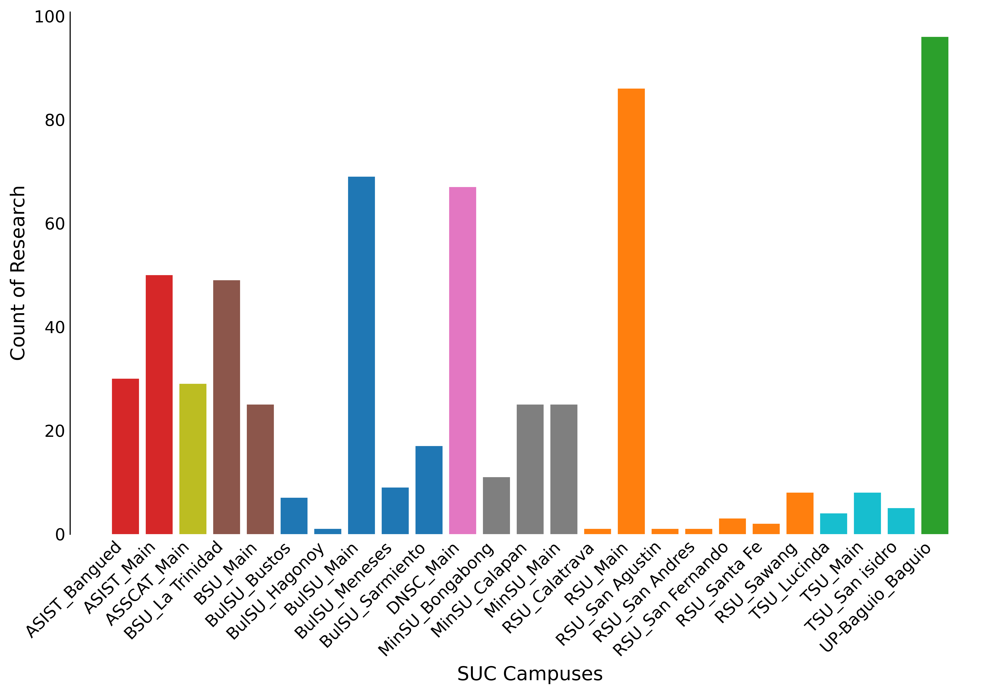

In [46]:
temp1 = df['University (Abbreviation)'].value_counts()
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(temp1[temp1 > 5])))
temp = df.groupby(['University (Abbreviation)', 'Campus'])['Research Title'].count().reset_index()
temp = temp[temp['University (Abbreviation)'].isin(temp1[temp1 > 5].index)]
univ_colors = dict()
for i, v in enumerate(temp1[temp1 > 5].index):
    univ_colors[v] = colors[i]
temp['colors'] = temp['University (Abbreviation)'].map(univ_colors)
# temp['Campus1'] = temp.iloc[:, 0] + '_Main'
# temp['Campus'] = np.where(temp['Campus'] == 'Main', temp['Campus1'], temp['Campus'])
temp['Campus'] = temp['University (Abbreviation)'] + '_' + temp['Campus']
# temp = temp.drop('Campus1', axis=1)

plt.figure(figsize=(12,7), dpi=600)
plt.bar(temp['Campus'], temp['Research Title'], color=temp['colors'], label='')
plt.xticks(rotation=45, ha='right')
plt.xlabel('SUC Campuses', fontsize=14)
plt.ylabel('Count of Research', fontsize=14)
plt.tick_params(axis='both', which='both', length=0, labelsize=12)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
plt.show()

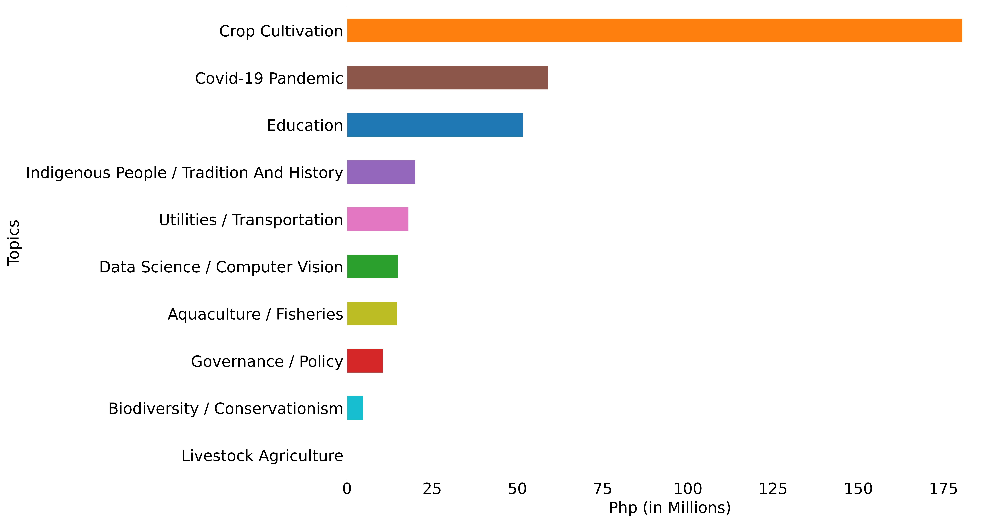

In [17]:
temp_ = df[['Topic Name', 'Allocated Budget (PH Pesos) 1,000,000.00']].dropna()
temp_['Topic Name'] = temp_['Topic Name'].str.title()
temp_ = temp_[temp_['Allocated Budget (PH Pesos) 1,000,000.00'] > 0]
temp_ = temp_.groupby('Topic Name')['Allocated Budget (PH Pesos) 1,000,000.00'].sum()/1000000
plt.figure(figsize=(12,9), dpi=600)
temp_.sort_values().drop('Outliers').plot(kind='barh', color=[colors[i] for i in temp_.sort_values().index.drop('Outliers')])
plt.xlabel('Php (in Millions)', fontsize=16)
plt.ylabel('Topics', fontsize=16)
plt.tick_params(axis='both', which='both', length=0, labelsize=16)
plt.gca().spines.right.set_visible(False)
plt.gca().spines.top.set_visible(False)
plt.gca().spines.bottom.set_visible(False)
plt.show()